#1st

In [1]:


image_folder = '/kaggle/input/btp-kodak-dataset'

#2nd

In [2]:
!pip install pywavelets

##PMSC

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class PMSCBlock(nn.Module):
    def __init__(self, in_channels):
        super(PMSCBlock, self).__init__()
        self.in_channels = in_channels

        # Left branch convolutions with cascading concatenation
        self.left_conv1 = nn.Conv2d(in_channels, in_channels // 4, kernel_size=1)
        self.left_conv2 = nn.Conv2d(in_channels // 4, in_channels // 4, kernel_size=(3, 1), padding=(1, 0))
        self.left_conv3 = nn.Conv2d(in_channels // 4, in_channels // 4, kernel_size=(5, 1), padding=(2, 0))
        self.left_conv4 = nn.Conv2d(in_channels // 4, in_channels // 4, kernel_size=(7, 1), padding=(3, 0))
        self.bn1 = nn.BatchNorm2d(in_channels // 4)
        self.bn2 = nn.BatchNorm2d(in_channels // 4)
        self.bn3 = nn.BatchNorm2d(in_channels // 4)
        self.bn4 = nn.BatchNorm2d(in_channels // 4)

        # Right branch convolutions with cascading concatenation
        self.right_conv1 = nn.Conv2d(in_channels, in_channels // 4, kernel_size=1)
        self.right_conv2 = nn.Conv2d(in_channels // 4, in_channels // 4, kernel_size=(3, 1), padding=(1, 0))
        self.right_conv3 = nn.Conv2d(in_channels // 4, in_channels // 4, kernel_size=(5, 1), padding=(2, 0))
        self.right_conv4 = nn.Conv2d(in_channels // 4, in_channels // 4, kernel_size=(7, 1), padding=(3, 0))
        self.bn5 = nn.BatchNorm2d(in_channels // 4)
        self.bn6 = nn.BatchNorm2d(in_channels // 4)
        self.bn7 = nn.BatchNorm2d(in_channels // 4)
        self.bn8 = nn.BatchNorm2d(in_channels // 4)

        # Shortcut connection
        self.shortcut_conv = nn.Conv2d(in_channels, in_channels, kernel_size=1)

        # Final 1x1 convolution to control output channels back to in_channels
        self.output_conv = nn.Conv2d(2 * in_channels, in_channels, kernel_size=1)

    def forward(self, x):
        # Left branch
        y1_left = F.relu(self.bn1(self.left_conv1(x)))
        y2_left = F.relu(self.bn2(self.left_conv2(y1_left)))
        y3_left = F.relu(self.bn3(self.left_conv3(y2_left)))
        y4_left = F.relu(self.bn4(self.left_conv4(y3_left)))
        y_left = torch.cat([y1_left, y2_left, y3_left, y4_left], dim=1)

        # Right branch
        y1_right = F.relu(self.bn5(self.right_conv1(x)))
        y2_right = F.relu(self.bn6(self.right_conv2(y1_right)))
        y3_right = F.relu(self.bn7(self.right_conv3(y2_right)))
        y4_right = F.relu(self.bn8(self.right_conv4(y3_right)))
        y_right = torch.cat([y1_right, y2_right, y3_right, y4_right], dim=1)

        # Concatenate the outputs from both branches
        combined = torch.cat([y_left, y_right], dim=1)

        # Shortcut connection
        shortcut = self.shortcut_conv(x)

        # Reduce the combined channels to match the input channels
        combined = self.output_conv(combined)

        # Add the shortcut connection
        output = combined + shortcut
        return output

##Wavelet Attention

In [4]:

# Haar Wavelet Attention remains the same
class HaarWaveletAttention(nn.Module):
    def __init__(self, in_channels):
        super(HaarWaveletAttention, self).__init__()
        self.in_channels = in_channels

        # Convolution layers for attention on the decomposed components
        self.attention_conv = nn.Sequential(
            nn.Conv2d(4 * in_channels, in_channels, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(in_channels),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(in_channels, in_channels, kernel_size=1, stride=1, padding=0),
            nn.Sigmoid()
        )

    def forward(self, x):
        LL, LH, HL, HH = self.haar_decompose(x)
        features = torch.cat([LL, LH, HL, HH], dim=1)
        attention_map = self.attention_conv(features)
        attention_map = F.interpolate(attention_map, size=x.shape[2:], mode='bilinear', align_corners=False)
        output = x * attention_map
        return output

    def haar_decompose(self, x):
        """ Perform Haar wavelet decomposition. """
        LL = (x[:, :, 0::2, 0::2] + x[:, :, 0::2, 1::2] + x[:, :, 1::2, 0::2] + x[:, :, 1::2, 1::2]) / 4
        LH = (x[:, :, 0::2, 0::2] - x[:, :, 0::2, 1::2] + x[:, :, 1::2, 0::2] - x[:, :, 1::2, 1::2]) / 4
        HL = (x[:, :, 0::2, 0::2] + x[:, :, 0::2, 1::2] - x[:, :, 1::2, 0::2] - x[:, :, 1::2, 1::2]) / 4
        HH = (x[:, :, 0::2, 0::2] - x[:, :, 0::2, 1::2] - x[:, :, 1::2, 0::2] + x[:, :, 1::2, 1::2]) / 4
        return LL, LH, HL, HH

##Self Attention

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SelfAttentionBlock(nn.Module):
    def __init__(self, embed_dim, num_heads=8):
        super(SelfAttentionBlock, self).__init__()
        self.self_attention = nn.MultiheadAttention(embed_dim, num_heads, batch_first=True)

    def forward(self, x):
        # Flatten the spatial dimensions for multi-head attention
        b, c, h, w = x.size()
        x_flat = x.view(b, c, h * w).permute(0, 2, 1)  # (batch, seq_len, embed_dim)

        # Self-attention
        x_att, _ = self.self_attention(x_flat, x_flat, x_flat)

        # Reshape back to (b, c, h, w)
        x_att = x_att.permute(0, 2, 1).view(b, c, h, w)
        return x + x_att  # Add residual connection

##Importance map

In [6]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ImportanceMapSubnetwork(nn.Module):
    def __init__(self, N):
        super(ImportanceMapSubnetwork, self).__init__()

        # First block of convolutions
        self.conv1 = nn.Conv2d(N, N // 2, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(N // 2, N // 2, kernel_size=1, stride=1, padding=0)
        self.conv3 = nn.Conv2d(N // 2, N // 2, kernel_size=3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(N // 2, N, kernel_size=1, stride=1, padding=0)  # Output N channels
        self.skip_conv1 = nn.Conv2d(N // 2, N, kernel_size=1, stride=1, padding=0)  # For matching channels in skip connection

        # Second block of convolutions
        self.conv5 = nn.Conv2d(N, N // 2, kernel_size=1, stride=1, padding=0)
        self.conv6 = nn.Conv2d(N // 2, N // 2, kernel_size=3, stride=1, padding=1)
        self.conv7 = nn.Conv2d(N // 2, N, kernel_size=1, stride=1, padding=0)
        self.skip_conv2 = nn.Conv2d(N, N, kernel_size=1, stride=1, padding=0)  # For matching channels in skip connection

        # Third block of convolutions
        self.conv8 = nn.Conv2d(N, N // 2, kernel_size=1, stride=1, padding=0)
        self.conv9 = nn.Conv2d(N // 2, N // 2, kernel_size=3, stride=1, padding=1)
        self.conv10 = nn.Conv2d(N // 2, N, kernel_size=1, stride=1, padding=0)
        self.skip_conv3 = nn.Conv2d(N, N, kernel_size=1, stride=1, padding=0)  # For matching channels in skip connection

        # Final Tanh and Softsign activation layers
        self.tanh = nn.Tanh()
        self.softsign = nn.Softsign()

    def forward(self, x):
        # First block
        x = F.relu(self.conv1(x))
        y1 = self.skip_conv1(x)  # Adjust y1 to have N channels
        x = F.relu(self.conv2(x))
        x = F.relu(self.conv3(x))
        x = self.conv4(x)
        x = x + y1  # Skip connection
        y2 = x

        # Second block
        x = F.relu(self.conv5(x))
        x = F.relu(self.conv6(x))
        x = self.conv7(x)
        x = x + self.skip_conv2(y2)  # Adjust y2 to have N channels
        y3 = x

        # Third block
        x = F.relu(self.conv8(x))
        x = F.relu(self.conv9(x))
        x = self.conv10(x)
        w = x + self.skip_conv3(y3)  # Adjust y3 to have N channels

        # Final activations
        n = self.tanh(w)
        m = self.softsign(n)

        return m

##Quantization

In [7]:
class QuantizationBlock(torch.nn.Module):
    def __init__(self, num_levels=256):
        super(QuantizationBlock, self).__init__()
        self.num_levels = num_levels

    def forward(self, x):
        # Quantize the input values
        x_quantized = (x * (self.num_levels - 1)).round().long()  # Quantize to integer values [0, num_levels-1]
        return x_quantized


class DequantizationBlock(torch.nn.Module):
    def __init__(self, num_levels=256):
        super(DequantizationBlock, self).__init__()
        self.num_levels = num_levels

    def forward(self, x_quantized):
        # Dequantize the values to float range [0, 1]
        x_dequantized = x_quantized.float() / (self.num_levels - 1)
        return x_dequantized

##Arithmetic encoding and decoding

In [8]:
class ArithmeticEncoder(torch.nn.Module):
    def __init__(self, num_levels=256):
        super(ArithmeticEncoder, self).__init__()
        self.num_levels = num_levels

    def forward(self, x_quantized):
        # Assume x_quantized is a 2D tensor with values [0, num_levels-1]
        hist = torch.histc(x_quantized.float(), bins=self.num_levels, min=0, max=self.num_levels-1)
        hist = hist / hist.sum()  # Normalize the histogram to get probabilities

        # Simulate encoding: we just return the probability distribution (in practice, it will be range coding)
        return hist


class ArithmeticDecoder(torch.nn.Module):
    def __init__(self, num_levels=256):
        super(ArithmeticDecoder, self).__init__()
        self.num_levels = num_levels

    def forward(self, hist, shape):
        # Reconstruct the quantized values from the histogram
        dist = torch.distributions.Categorical(probs=hist)
        sampled_indices = dist.sample(sample_shape=(shape[0], shape[1]))  # Sample from distribution

        return sampled_indices.long()  # Return indices as long (quantized values)

##Core Encoder

In [9]:
import torch.nn.functional as F

class CoreEncoder(nn.Module):
    def __init__(self, channels=3, N=192, G=192):
        super(CoreEncoder, self).__init__()

        # Initial Convolutional Layers with BatchNorm and Activations
        self.conv1 = nn.Conv2d(channels, N, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(N)
        # self.act1 = nn.ReLU()
        self.act1 = nn.LeakyReLU(0.2, inplace=True)

        self.conv2 = nn.Conv2d(N, N, kernel_size=3, stride=2, padding=1)
        self.bn2 = nn.BatchNorm2d(N)
        # self.act2 = nn.ReLU()
        self.act2 = nn.LeakyReLU(0.2, inplace=True)

        # First PMSC Block and Attention Module
        self.pmsc1 = PMSCBlock(N)
        # self.attn1 = HaarWaveletAttention(N)
        self.attn1 = SelfAttentionBlock(embed_dim=N, num_heads=8)

        # Middle Convolutional Layers with BatchNorm and Activations
        self.conv3 = nn.Conv2d(N, N, kernel_size=3, stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(N)
        # self.act3 = nn.ReLU()
        self.act3 = nn.LeakyReLU(0.2, inplace=True)

        self.conv4 = nn.Conv2d(N, N, kernel_size=3, stride=2, padding=1)
        self.bn4 = nn.BatchNorm2d(N)
        # self.act4 = nn.ReLU()
        self.act4 = nn.LeakyReLU(0.2, inplace=True)

        # Second PMSC Block and Attention Module
        self.pmsc2 = PMSCBlock(N)
        # self.attn2 = HaarWaveletAttention(N)
        self.attn2 = SelfAttentionBlock(embed_dim=N, num_heads=8)

        # Final Convolution and Attention Module
        self.conv5 = nn.Conv2d(N, G, kernel_size=3, stride=2, padding=1)
        self.bn5 = nn.BatchNorm2d(G)
        # self.act5 = nn.ReLU()
        self.act5 = nn.LeakyReLU(0.2, inplace=True)

        self.conv6 = nn.Conv2d(G, G, kernel_size=3, stride=1, padding=1)
        self.bn6 = nn.BatchNorm2d(G)

        self.conv7 = nn.Conv2d(G, G, kernel_size=3, stride=1, padding=1)
        self.bn7 = nn.BatchNorm2d(G)

        self.pmsc3 = PMSCBlock(G)

        # Final activation layer
        self.final_activation = nn.Sigmoid()
        self.importance_map = ImportanceMapSubnetwork(G)
        # self.self_attention1 = SelfAttentionBlock(embed_dim=N, num_heads=8)
        # Convolution to match the number of channels of y1
        self.quantization = QuantizationBlock(num_levels=64)
        self.arithmetic_encoder = ArithmeticEncoder(num_levels=64)
        self.match_channels = nn.Conv2d(channels, N, kernel_size=1, stride=1, padding=0)

    def forward(self, x):
        # Initial Convolutional Layers
        y1 = x
        x = self.act1(self.bn1(self.conv1(x)))  # Conv1 -> BN -> ReLU
        x = self.act2(self.bn2(self.conv2(x)))  # Conv2 -> BN -> ReLU

        # Apply convolution to match the number of channels of y1
        y1 = self.match_channels(y1)

        # Upsample y1 to match the size of x
        y1 = F.interpolate(y1, size=x.shape[2:], mode='bilinear', align_corners=False)

        x = x + y1  # Residual connection with matching dimensions
        # x = self.self_attention1(x)
        # First PMSC Block and Attention Module
        x = self.pmsc1(x)
        y2 = x

        # Middle Convolutional Layers
        x = self.act3(self.bn3(self.conv3(x)))  # Conv3 -> BN -> ReLU
        x = self.act4(self.bn4(self.conv4(x)))  # Conv4 -> BN -> ReLU

        # Upsample y2 to match the size of x before the addition
        y2 = F.interpolate(y2, size=x.shape[2:], mode='bilinear', align_corners=False)

        x = x + y2  # Residual connection with matching dimensions

        x = self.attn1(x)

        # Second PMSC Block and Attention Module
        x = self.pmsc2(x)
        y3 = x

        # Final Convolution and Attention Module
        x = self.act5(self.bn5(self.conv5(x)))  # Conv5 -> BN -> ReLU
        x = self.bn6(self.conv6(x))  # Conv6 -> BN

        # Upsample y3 to match the size of x before the addition
        y3 = F.interpolate(y3, size=x.shape[2:], mode='bilinear', align_corners=False)

        x = x + y3  # Residual connection with matching dimensions
        x = self.pmsc3(x)

        y4 = self.importance_map(x)
        x = self.bn7(self.conv7(x))  # Conv7 -> BN
        x = self.attn2(x)

        #dot product of x and y4
        x = torch.mul(x, y4)

        # Final Activation
        x = self.final_activation(x)
        # x = self.quantization(x)
        # x = self.arithmetic_encoder(x)

        return x

##Core Decoder

In [10]:
import torch.nn.functional as F

class CoreDecoder(nn.Module):
    def __init__(self, channels=3, N=192):
        super(CoreDecoder, self).__init__()

        # Attention and Convolution Layers
        # self.attention1 = HaarWaveletAttention(N)
        self.attention1 = SelfAttentionBlock(embed_dim=N, num_heads=8)

        self.conv1 = nn.Conv2d(N, N, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(N, N, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(N, N, kernel_size=3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(N, N, kernel_size=3, stride=1, padding=1)

        self.pmsc = PMSCBlock(N)

        # self.attention2 = HaarWaveletAttention(N)
        self.attention2 = SelfAttentionBlock(embed_dim=N, num_heads=8)

        self.conv5 = nn.Conv2d(N, N, kernel_size=3, stride=1, padding=1)
        self.conv6 = nn.Conv2d(N, N, kernel_size=3, stride=1, padding=1)

        # Batch Norm for each convolution layer
        self.bn1 = nn.BatchNorm2d(N)
        self.bn2 = nn.BatchNorm2d(N)
        self.bn3 = nn.BatchNorm2d(N)
        self.bn4 = nn.BatchNorm2d(N)
        self.bn5 = nn.BatchNorm2d(N)
        self.bn6 = nn.BatchNorm2d(N)

        #activation
        self.act1 = nn.LeakyReLU(0.2, inplace=True)
        self.act2 = nn.LeakyReLU(0.2, inplace=True)
        self.act3 = nn.LeakyReLU(0.2, inplace=True)
        self.act4 = nn.LeakyReLU(0.2, inplace=True)
        self.act5 = nn.LeakyReLU(0.2, inplace=True)
        self.act6 = nn.LeakyReLU(0.2, inplace=True)

        # self.self_attention2 = SelfAttentionBlock(embed_dim=N, num_heads=8)
        # Arithmetic Decoder
        self.arithmetic_decoder = ArithmeticDecoder(num_levels=256)

        # Dequantization Block
        self.dequantization = DequantizationBlock(num_levels=256)
        # Output layer
        self.conv_transpose = nn.Conv2d(N, channels, kernel_size=3, stride=1, padding=1)

    def forward(self, x):
        # First Attention Module
        x = self.attention1(x)
        y1 = x

        # Convolutions with Activation & Batch Norm
        x = self.act1(self.bn1(self.conv1(x)))
        x = self.act2(self.bn2(self.conv2(x)))
        x = y1 + x

        y2 = x
        x = self.act3(self.bn3(self.conv3(x)))
        x = self.act4(self.bn4(self.conv4(x)))
        x = y2 + x

        # Second Attention Module
        x = self.attention2(x)

        # x = self.self_attention2(x)

        # PMSC Block
        x = self.pmsc(x)
        y3 = x

        # Additional Convolutions
        x = self.act5(self.bn5(self.conv5(x)))
        x = self.act6(self.bn6(self.conv6(x)))
        x = y3 + x


        # Upsampling (Assuming a total upscale of 8x)
        # x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)
        # x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)
        # x = F.interpolate(x, scale_factor=2, mode='bilinear', align_corners=False)
        x = F.interpolate(x, size=(256, 256), mode='bilinear', align_corners=False)


        # Final Convolution Layer
        x = self.conv_transpose(x)

        return x

Epoch [1/250], Loss: 2.1532, PSNR: 7.5194, SSIM: 0.2085
Epoch [2/250], Loss: 0.5658, PSNR: 12.5914, SSIM: 0.2231
Epoch [3/250], Loss: 0.2994, PSNR: 15.3017, SSIM: 0.2446
Epoch [4/250], Loss: 0.2184, PSNR: 16.7439, SSIM: 0.2608
Epoch [5/250], Loss: 0.1636, PSNR: 17.9438, SSIM: 0.2788
Epoch [6/250], Loss: 0.1340, PSNR: 18.7707, SSIM: 0.2958
Epoch [7/250], Loss: 0.1368, PSNR: 18.7251, SSIM: 0.2972
Epoch [8/250], Loss: 0.1341, PSNR: 18.8661, SSIM: 0.3062
Epoch [9/250], Loss: 0.1052, PSNR: 19.9425, SSIM: 0.3276
Epoch [10/250], Loss: 0.1074, PSNR: 19.7731, SSIM: 0.3288


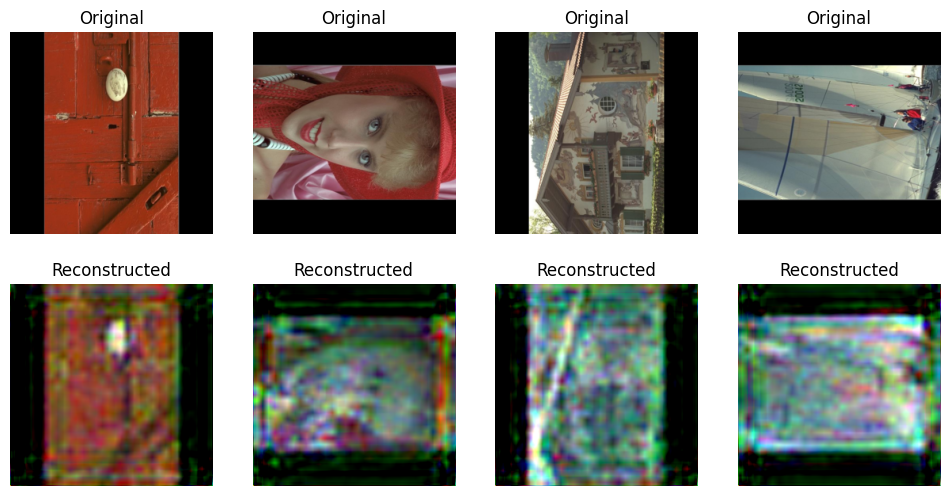

Epoch [11/250], Loss: 0.0982, PSNR: 20.2052, SSIM: 0.3418
Epoch [12/250], Loss: 0.1010, PSNR: 20.0849, SSIM: 0.3475
Epoch [13/250], Loss: 0.0845, PSNR: 20.8467, SSIM: 0.3613
Epoch [14/250], Loss: 0.0675, PSNR: 21.7968, SSIM: 0.3739
Epoch [15/250], Loss: 0.0845, PSNR: 20.8860, SSIM: 0.3652
Epoch [16/250], Loss: 0.0687, PSNR: 21.7166, SSIM: 0.3827
Epoch [17/250], Loss: 0.0598, PSNR: 22.4003, SSIM: 0.3916
Epoch [18/250], Loss: 0.0611, PSNR: 22.2285, SSIM: 0.3955
Epoch [19/250], Loss: 0.0569, PSNR: 22.6264, SSIM: 0.4063
Epoch [20/250], Loss: 0.0529, PSNR: 22.8535, SSIM: 0.4133


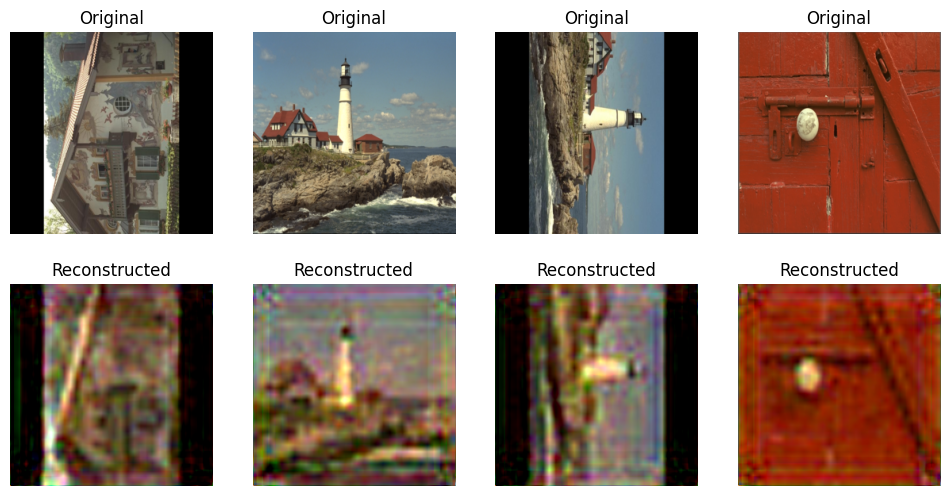

Epoch [21/250], Loss: 0.0621, PSNR: 22.1655, SSIM: 0.4056
Epoch [22/250], Loss: 0.0553, PSNR: 22.7574, SSIM: 0.4196
Epoch [23/250], Loss: 0.0555, PSNR: 22.6745, SSIM: 0.4208
Epoch [24/250], Loss: 0.0527, PSNR: 22.9279, SSIM: 0.4265
Epoch [25/250], Loss: 0.0548, PSNR: 22.8089, SSIM: 0.4271
Epoch [26/250], Loss: 0.0469, PSNR: 23.3546, SSIM: 0.4365
Epoch [27/250], Loss: 0.0444, PSNR: 23.6326, SSIM: 0.4469
Epoch [28/250], Loss: 0.0421, PSNR: 23.8444, SSIM: 0.4528
Epoch [29/250], Loss: 0.0507, PSNR: 23.0694, SSIM: 0.4413
Epoch [30/250], Loss: 0.0432, PSNR: 23.7173, SSIM: 0.4526


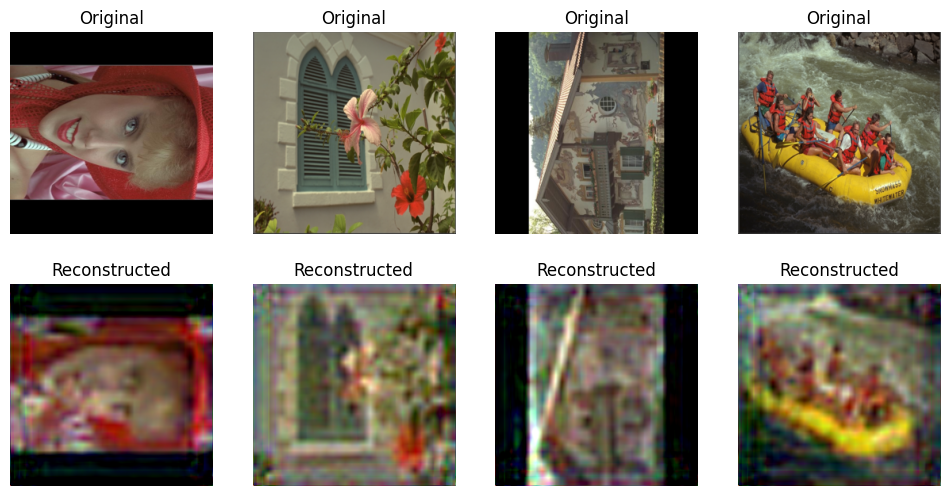

Epoch [31/250], Loss: 0.0451, PSNR: 23.5900, SSIM: 0.4508
Epoch [32/250], Loss: 0.0449, PSNR: 23.6107, SSIM: 0.4567
Epoch [33/250], Loss: 0.0398, PSNR: 24.1020, SSIM: 0.4657
Epoch [34/250], Loss: 0.0411, PSNR: 23.9594, SSIM: 0.4675
Epoch [35/250], Loss: 0.0362, PSNR: 24.4838, SSIM: 0.4765
Epoch [36/250], Loss: 0.0428, PSNR: 23.8181, SSIM: 0.4703
Epoch [37/250], Loss: 0.0355, PSNR: 24.5783, SSIM: 0.4820
Epoch [38/250], Loss: 0.0412, PSNR: 23.9596, SSIM: 0.4706
Epoch [39/250], Loss: 0.0349, PSNR: 24.6677, SSIM: 0.4876
Epoch [40/250], Loss: 0.0387, PSNR: 24.2616, SSIM: 0.4817


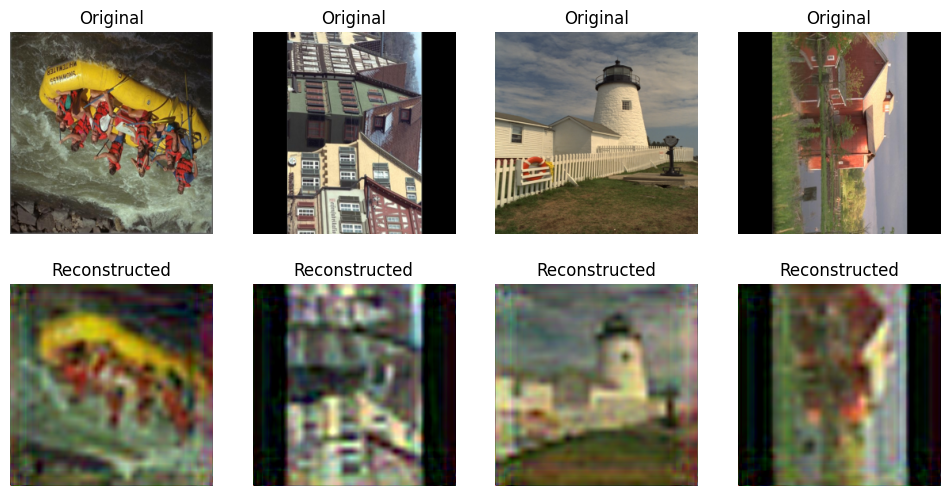

Epoch [41/250], Loss: 0.0424, PSNR: 23.9308, SSIM: 0.4762
Epoch [42/250], Loss: 0.0382, PSNR: 24.2581, SSIM: 0.4860
Epoch [43/250], Loss: 0.0392, PSNR: 24.1994, SSIM: 0.4852
Epoch [44/250], Loss: 0.0344, PSNR: 24.7289, SSIM: 0.4961
Epoch [45/250], Loss: 0.0340, PSNR: 24.8296, SSIM: 0.5034
Epoch [46/250], Loss: 0.0496, PSNR: 23.2027, SSIM: 0.4791
Epoch [47/250], Loss: 0.0382, PSNR: 24.2800, SSIM: 0.4969
Epoch [48/250], Loss: 0.0316, PSNR: 25.0736, SSIM: 0.5076
Epoch [49/250], Loss: 0.0382, PSNR: 24.3969, SSIM: 0.4963
Epoch [50/250], Loss: 0.0331, PSNR: 24.9082, SSIM: 0.5066


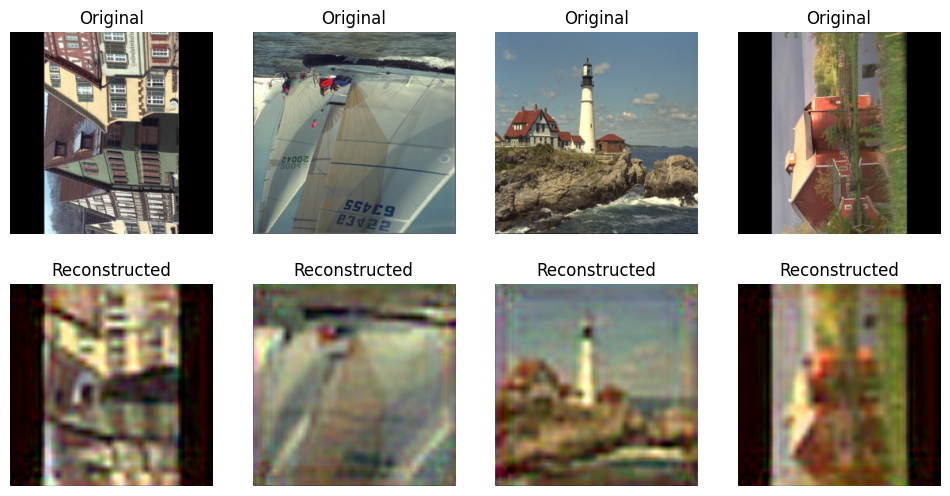

Epoch [51/250], Loss: 0.0412, PSNR: 24.0469, SSIM: 0.4977
Epoch [52/250], Loss: 0.0411, PSNR: 24.0102, SSIM: 0.4976
Epoch [53/250], Loss: 0.0389, PSNR: 24.2743, SSIM: 0.5047
Epoch [54/250], Loss: 0.0448, PSNR: 23.6309, SSIM: 0.4897
Epoch [55/250], Loss: 0.0356, PSNR: 24.6174, SSIM: 0.5073
Epoch [56/250], Loss: 0.0304, PSNR: 25.2777, SSIM: 0.5221
Epoch [57/250], Loss: 0.0343, PSNR: 24.7560, SSIM: 0.5176
Epoch [58/250], Loss: 0.0297, PSNR: 25.3682, SSIM: 0.5290
Epoch [59/250], Loss: 0.0309, PSNR: 25.2278, SSIM: 0.5233
Epoch [60/250], Loss: 0.0295, PSNR: 25.3652, SSIM: 0.5290


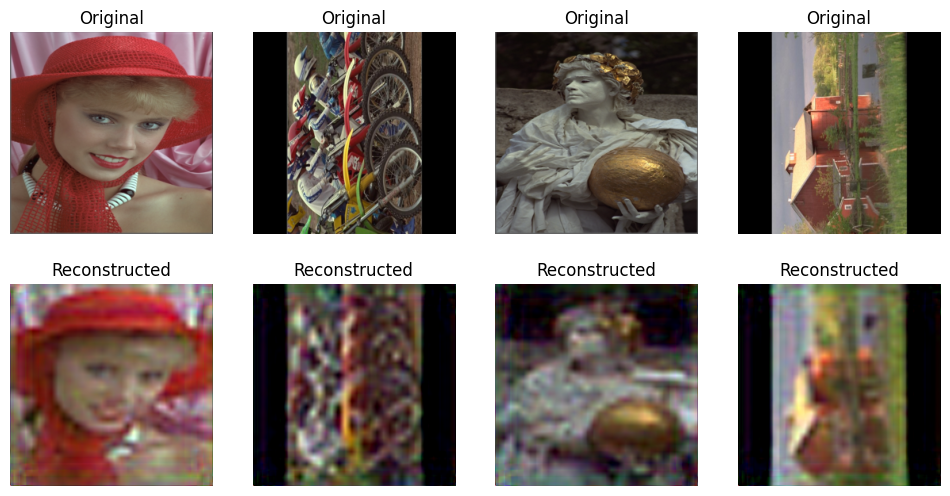

Epoch [61/250], Loss: 0.0315, PSNR: 25.1192, SSIM: 0.5224
Epoch [62/250], Loss: 0.0307, PSNR: 25.2318, SSIM: 0.5273
Epoch [63/250], Loss: 0.0281, PSNR: 25.5974, SSIM: 0.5329
Epoch [64/250], Loss: 0.0305, PSNR: 25.2222, SSIM: 0.5301
Epoch [65/250], Loss: 0.0311, PSNR: 25.1871, SSIM: 0.5326
Epoch [66/250], Loss: 0.0277, PSNR: 25.6616, SSIM: 0.5406
Epoch [67/250], Loss: 0.0276, PSNR: 25.6642, SSIM: 0.5418
Epoch [68/250], Loss: 0.0265, PSNR: 25.8460, SSIM: 0.5495
Epoch [69/250], Loss: 0.0289, PSNR: 25.5070, SSIM: 0.5423
Epoch [70/250], Loss: 0.0249, PSNR: 26.1251, SSIM: 0.5567


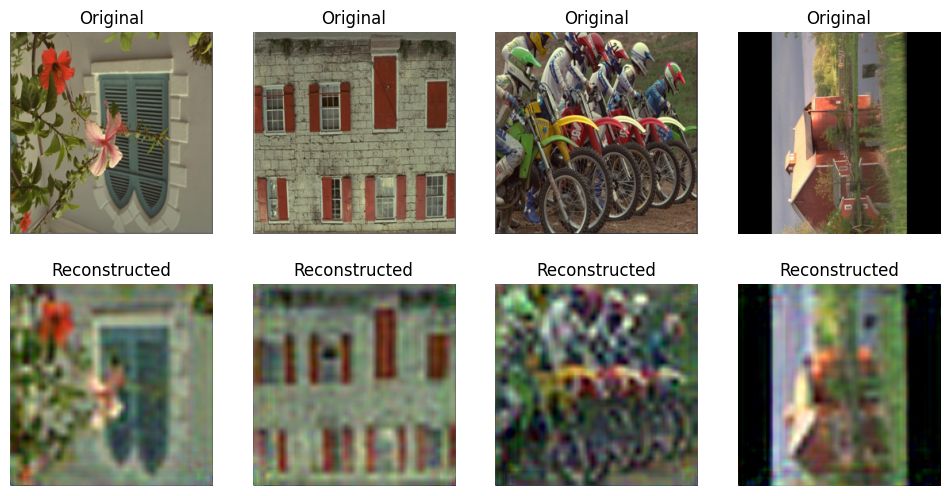

Epoch [71/250], Loss: 0.0285, PSNR: 25.5616, SSIM: 0.5448
Epoch [72/250], Loss: 0.0264, PSNR: 25.8857, SSIM: 0.5486
Epoch [73/250], Loss: 0.0260, PSNR: 25.9553, SSIM: 0.5520
Epoch [74/250], Loss: 0.0286, PSNR: 25.5937, SSIM: 0.5457
Epoch [75/250], Loss: 0.0303, PSNR: 25.2687, SSIM: 0.5419
Epoch [76/250], Loss: 0.0288, PSNR: 25.5360, SSIM: 0.5515
Epoch [77/250], Loss: 0.0298, PSNR: 25.3790, SSIM: 0.5482
Epoch [78/250], Loss: 0.0297, PSNR: 25.4203, SSIM: 0.5482
Epoch [79/250], Loss: 0.0252, PSNR: 26.0739, SSIM: 0.5581
Epoch [80/250], Loss: 0.0265, PSNR: 25.8563, SSIM: 0.5601


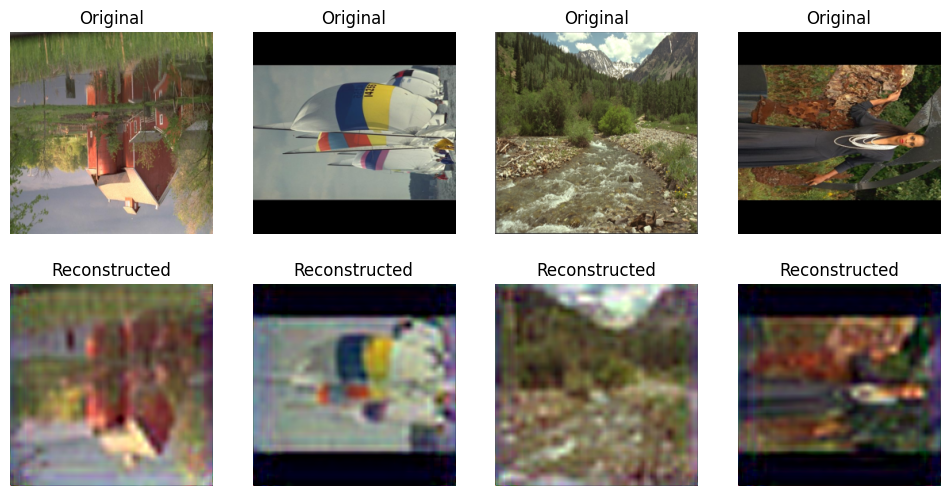

Epoch [81/250], Loss: 0.0290, PSNR: 25.4774, SSIM: 0.5534
Epoch [82/250], Loss: 0.0277, PSNR: 25.6660, SSIM: 0.5563
Epoch [83/250], Loss: 0.0270, PSNR: 25.7715, SSIM: 0.5586
Epoch [84/250], Loss: 0.0254, PSNR: 26.0585, SSIM: 0.5620
Epoch [85/250], Loss: 0.0270, PSNR: 25.7737, SSIM: 0.5554
Epoch [86/250], Loss: 0.0277, PSNR: 25.6570, SSIM: 0.5572
Epoch [87/250], Loss: 0.0272, PSNR: 25.7623, SSIM: 0.5608
Epoch [88/250], Loss: 0.0277, PSNR: 25.6613, SSIM: 0.5619
Epoch [89/250], Loss: 0.0249, PSNR: 26.1378, SSIM: 0.5703
Epoch [90/250], Loss: 0.0267, PSNR: 25.8863, SSIM: 0.5646


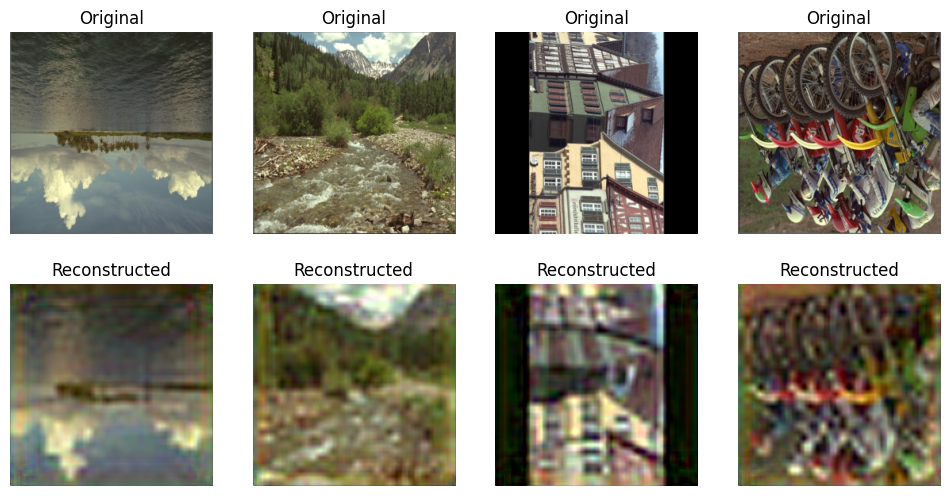

Epoch [91/250], Loss: 0.0253, PSNR: 26.0763, SSIM: 0.5708
Epoch [92/250], Loss: 0.0273, PSNR: 25.7676, SSIM: 0.5683
Epoch [93/250], Loss: 0.0273, PSNR: 25.7609, SSIM: 0.5651
Epoch [94/250], Loss: 0.0255, PSNR: 26.0057, SSIM: 0.5684
Epoch [95/250], Loss: 0.0263, PSNR: 25.9314, SSIM: 0.5721
Epoch [96/250], Loss: 0.0235, PSNR: 26.3831, SSIM: 0.5787
Epoch [97/250], Loss: 0.0250, PSNR: 26.1157, SSIM: 0.5753
Epoch [98/250], Loss: 0.0259, PSNR: 25.9810, SSIM: 0.5740
Epoch [99/250], Loss: 0.0230, PSNR: 26.4604, SSIM: 0.5851
Epoch [100/250], Loss: 0.0292, PSNR: 25.5054, SSIM: 0.5599


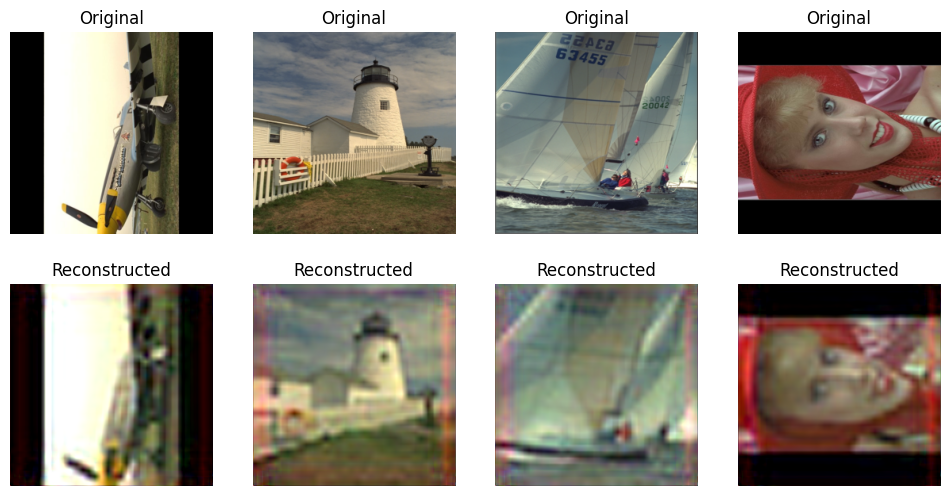

Epoch [101/250], Loss: 0.0234, PSNR: 26.4244, SSIM: 0.5822
Epoch [102/250], Loss: 0.0232, PSNR: 26.4519, SSIM: 0.5848
Epoch [103/250], Loss: 0.0262, PSNR: 25.9105, SSIM: 0.5758
Epoch [104/250], Loss: 0.0263, PSNR: 25.9654, SSIM: 0.5784
Epoch [105/250], Loss: 0.0249, PSNR: 26.1020, SSIM: 0.5762
Epoch [106/250], Loss: 0.0265, PSNR: 25.9205, SSIM: 0.5736
Epoch [107/250], Loss: 0.0361, PSNR: 24.7539, SSIM: 0.5609
Epoch [108/250], Loss: 0.0351, PSNR: 24.8205, SSIM: 0.5595
Epoch [109/250], Loss: 0.0248, PSNR: 26.1414, SSIM: 0.5807
Epoch [110/250], Loss: 0.0251, PSNR: 26.1430, SSIM: 0.5819


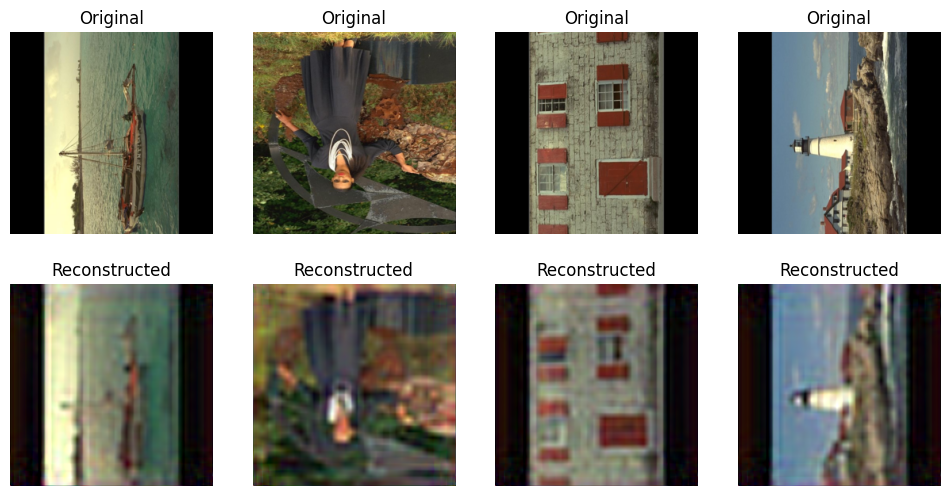

Epoch [111/250], Loss: 0.0261, PSNR: 25.9588, SSIM: 0.5774
Epoch [112/250], Loss: 0.0230, PSNR: 26.4567, SSIM: 0.5903
Epoch [113/250], Loss: 0.0249, PSNR: 26.1546, SSIM: 0.5854
Epoch [114/250], Loss: 0.0236, PSNR: 26.3776, SSIM: 0.5875
Epoch [115/250], Loss: 0.0236, PSNR: 26.3438, SSIM: 0.5884
Epoch [116/250], Loss: 0.0234, PSNR: 26.4189, SSIM: 0.5914
Epoch [117/250], Loss: 0.0226, PSNR: 26.5432, SSIM: 0.5964
Epoch [118/250], Loss: 0.0236, PSNR: 26.3580, SSIM: 0.5932
Epoch [119/250], Loss: 0.0213, PSNR: 26.8352, SSIM: 0.6037
Epoch [120/250], Loss: 0.0220, PSNR: 26.6599, SSIM: 0.6006


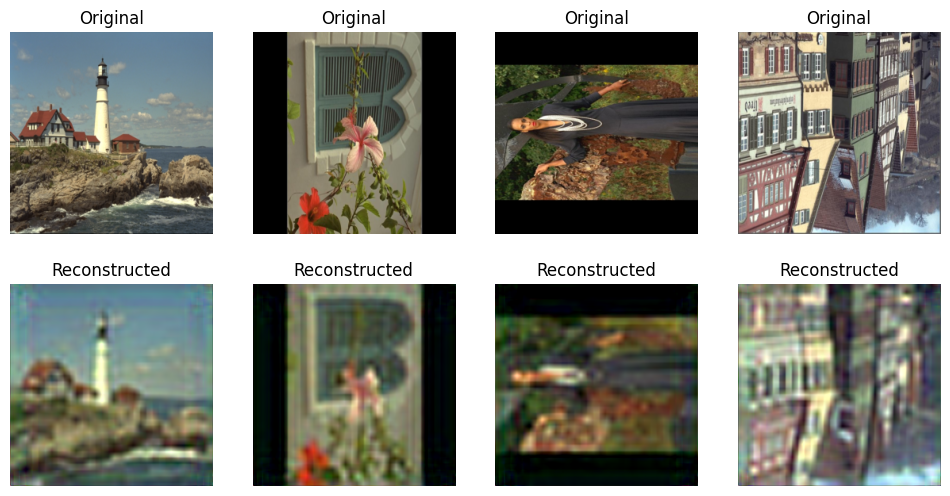

Epoch [121/250], Loss: 0.0245, PSNR: 26.2377, SSIM: 0.5912
Epoch [122/250], Loss: 0.0243, PSNR: 26.2518, SSIM: 0.5904
Epoch [123/250], Loss: 0.0269, PSNR: 25.8442, SSIM: 0.5848
Epoch [124/250], Loss: 0.0312, PSNR: 25.3088, SSIM: 0.5725
Epoch [125/250], Loss: 0.0243, PSNR: 26.2460, SSIM: 0.5901
Epoch [126/250], Loss: 0.0213, PSNR: 26.8242, SSIM: 0.6039
Epoch [127/250], Loss: 0.0216, PSNR: 26.7545, SSIM: 0.6057
Epoch [128/250], Loss: 0.0202, PSNR: 27.0609, SSIM: 0.6126
Epoch [129/250], Loss: 0.0209, PSNR: 26.8895, SSIM: 0.6070
Epoch [130/250], Loss: 0.0247, PSNR: 26.2157, SSIM: 0.5942


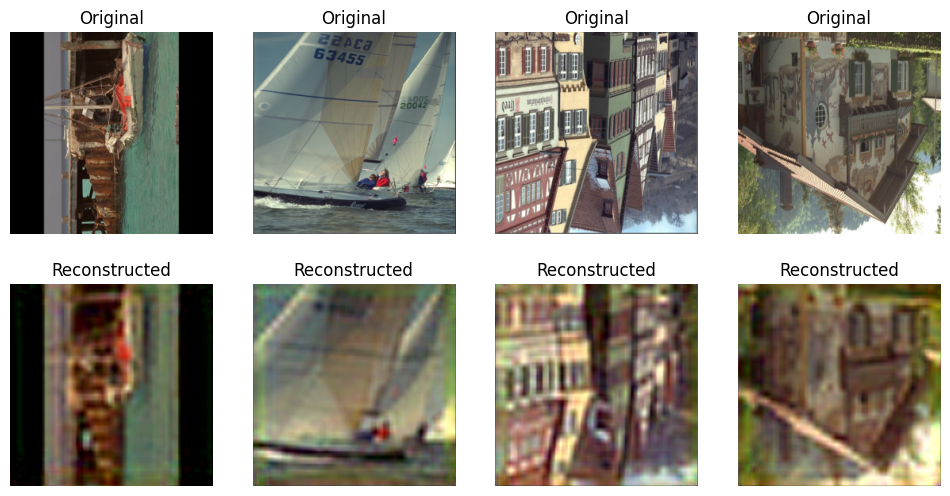

Epoch [131/250], Loss: 0.0215, PSNR: 26.7993, SSIM: 0.6065
Epoch [132/250], Loss: 0.0224, PSNR: 26.5559, SSIM: 0.6030
Epoch [133/250], Loss: 0.0224, PSNR: 26.6016, SSIM: 0.6009
Epoch [134/250], Loss: 0.0242, PSNR: 26.2484, SSIM: 0.6021
Epoch [135/250], Loss: 0.0250, PSNR: 26.1405, SSIM: 0.5960
Epoch [136/250], Loss: 0.0232, PSNR: 26.4526, SSIM: 0.6003
Epoch [137/250], Loss: 0.0228, PSNR: 26.5116, SSIM: 0.6016
Epoch [138/250], Loss: 0.0251, PSNR: 26.1323, SSIM: 0.6026
Epoch [139/250], Loss: 0.0219, PSNR: 26.7173, SSIM: 0.6101
Epoch [140/250], Loss: 0.0280, PSNR: 25.6737, SSIM: 0.5958


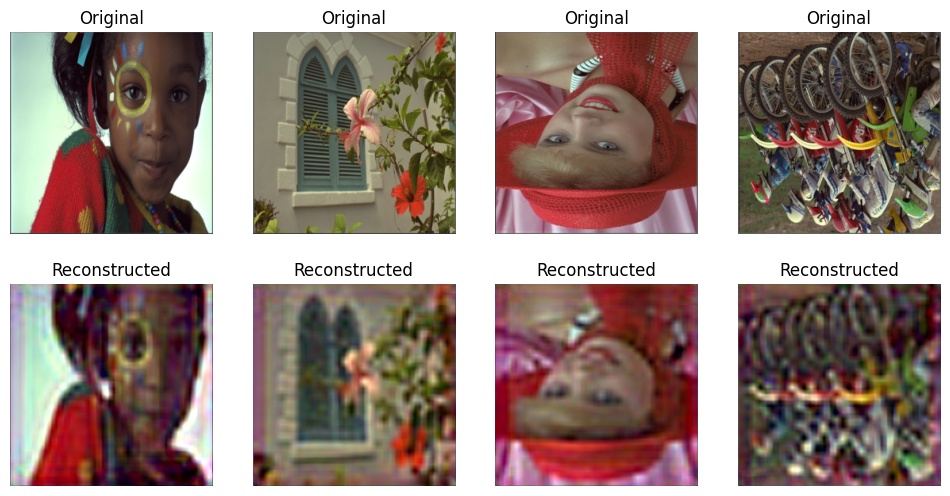

Epoch [141/250], Loss: 0.0257, PSNR: 26.0480, SSIM: 0.5954
Epoch [142/250], Loss: 0.0241, PSNR: 26.3166, SSIM: 0.6064
Epoch [143/250], Loss: 0.0219, PSNR: 26.6864, SSIM: 0.6102
Epoch [144/250], Loss: 0.0223, PSNR: 26.6353, SSIM: 0.6103
Epoch [145/250], Loss: 0.0214, PSNR: 26.8096, SSIM: 0.6170
Epoch [146/250], Loss: 0.0209, PSNR: 26.9323, SSIM: 0.6175
Epoch [147/250], Loss: 0.0217, PSNR: 26.7350, SSIM: 0.6139
Epoch [148/250], Loss: 0.0231, PSNR: 26.5032, SSIM: 0.6027
Epoch [149/250], Loss: 0.0216, PSNR: 26.7933, SSIM: 0.6139
Epoch [150/250], Loss: 0.0208, PSNR: 26.9218, SSIM: 0.6183


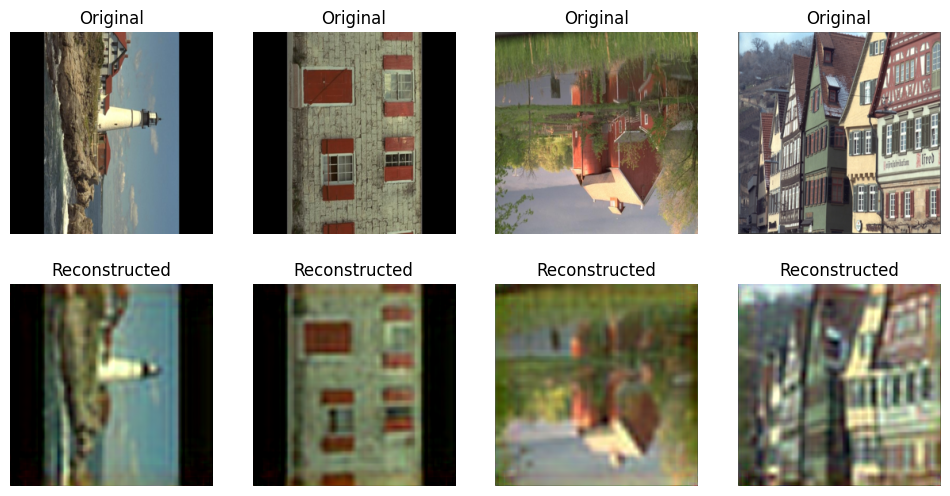

Epoch [151/250], Loss: 0.0196, PSNR: 27.2262, SSIM: 0.6240
Epoch [152/250], Loss: 0.0198, PSNR: 27.1575, SSIM: 0.6235
Epoch [153/250], Loss: 0.0205, PSNR: 26.9760, SSIM: 0.6209
Epoch [154/250], Loss: 0.0206, PSNR: 26.9823, SSIM: 0.6209
Epoch [155/250], Loss: 0.0235, PSNR: 26.4261, SSIM: 0.6073
Epoch [156/250], Loss: 0.0254, PSNR: 26.0647, SSIM: 0.6066
Epoch [157/250], Loss: 0.0198, PSNR: 27.1772, SSIM: 0.6291
Epoch [158/250], Loss: 0.0208, PSNR: 26.9510, SSIM: 0.6240
Epoch [159/250], Loss: 0.0197, PSNR: 27.1646, SSIM: 0.6278
Epoch [160/250], Loss: 0.0215, PSNR: 26.7844, SSIM: 0.6177


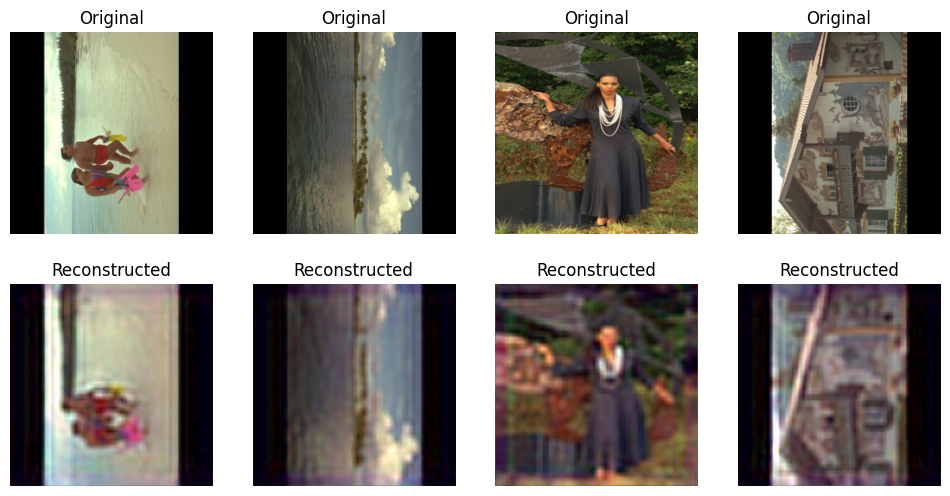

Epoch [161/250], Loss: 0.0206, PSNR: 26.9639, SSIM: 0.6261
Epoch [162/250], Loss: 0.0195, PSNR: 27.3112, SSIM: 0.6309
Epoch [163/250], Loss: 0.0186, PSNR: 27.4099, SSIM: 0.6340
Epoch [164/250], Loss: 0.0222, PSNR: 26.6576, SSIM: 0.6204
Epoch [165/250], Loss: 0.0217, PSNR: 26.7302, SSIM: 0.6156
Epoch [166/250], Loss: 0.0191, PSNR: 27.2544, SSIM: 0.6348
Epoch [167/250], Loss: 0.0196, PSNR: 27.2110, SSIM: 0.6308
Epoch [168/250], Loss: 0.0240, PSNR: 26.3268, SSIM: 0.6052
Epoch [169/250], Loss: 0.0257, PSNR: 26.0604, SSIM: 0.5995
Epoch [170/250], Loss: 0.0225, PSNR: 26.6314, SSIM: 0.6140


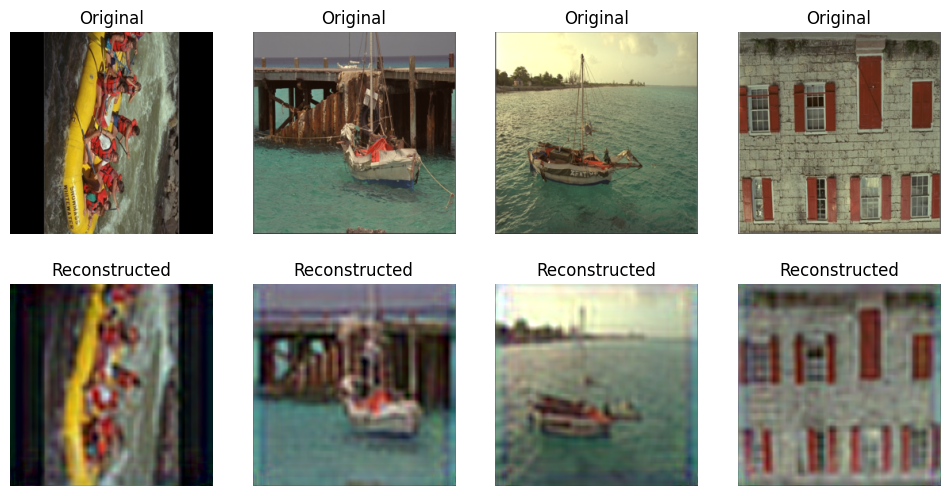

Epoch [171/250], Loss: 0.0236, PSNR: 26.3993, SSIM: 0.6072
Epoch [172/250], Loss: 0.0210, PSNR: 26.9283, SSIM: 0.6248
Epoch [173/250], Loss: 0.0203, PSNR: 27.0301, SSIM: 0.6237
Epoch [174/250], Loss: 0.0193, PSNR: 27.2866, SSIM: 0.6339
Epoch [175/250], Loss: 0.0198, PSNR: 27.1481, SSIM: 0.6332
Epoch [176/250], Loss: 0.0198, PSNR: 27.1381, SSIM: 0.6282
Epoch [177/250], Loss: 0.0195, PSNR: 27.1950, SSIM: 0.6371
Epoch [178/250], Loss: 0.0185, PSNR: 27.4206, SSIM: 0.6433
Epoch [179/250], Loss: 0.0195, PSNR: 27.1774, SSIM: 0.6337
Epoch [180/250], Loss: 0.0184, PSNR: 27.4483, SSIM: 0.6415


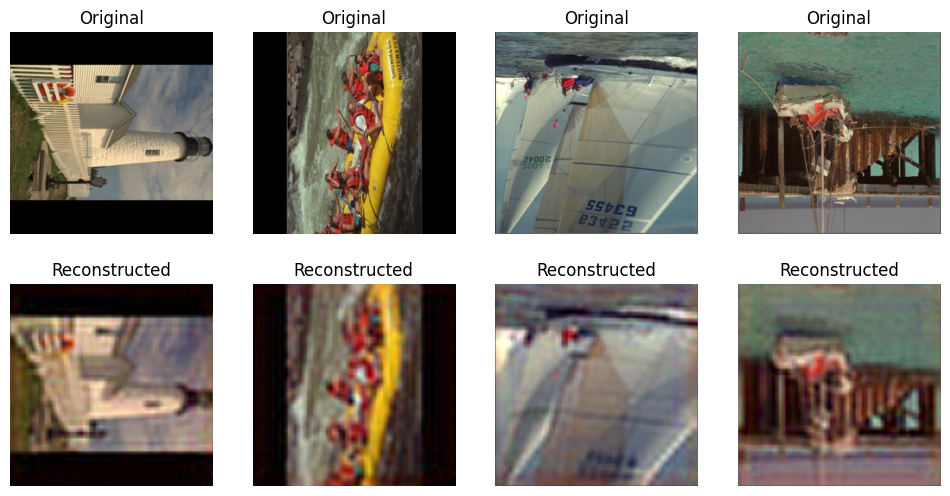

Epoch [181/250], Loss: 0.0200, PSNR: 27.2059, SSIM: 0.6364
Epoch [182/250], Loss: 0.0201, PSNR: 27.0677, SSIM: 0.6315
Epoch [183/250], Loss: 0.0215, PSNR: 26.7618, SSIM: 0.6316
Epoch [184/250], Loss: 0.0207, PSNR: 26.9586, SSIM: 0.6348
Epoch [185/250], Loss: 0.0191, PSNR: 27.3007, SSIM: 0.6371
Epoch [186/250], Loss: 0.0203, PSNR: 27.0810, SSIM: 0.6320
Epoch [187/250], Loss: 0.0206, PSNR: 27.0110, SSIM: 0.6326
Epoch [188/250], Loss: 0.0221, PSNR: 26.6843, SSIM: 0.6310
Epoch [189/250], Loss: 0.0187, PSNR: 27.3717, SSIM: 0.6430
Epoch [190/250], Loss: 0.0200, PSNR: 27.1197, SSIM: 0.6390


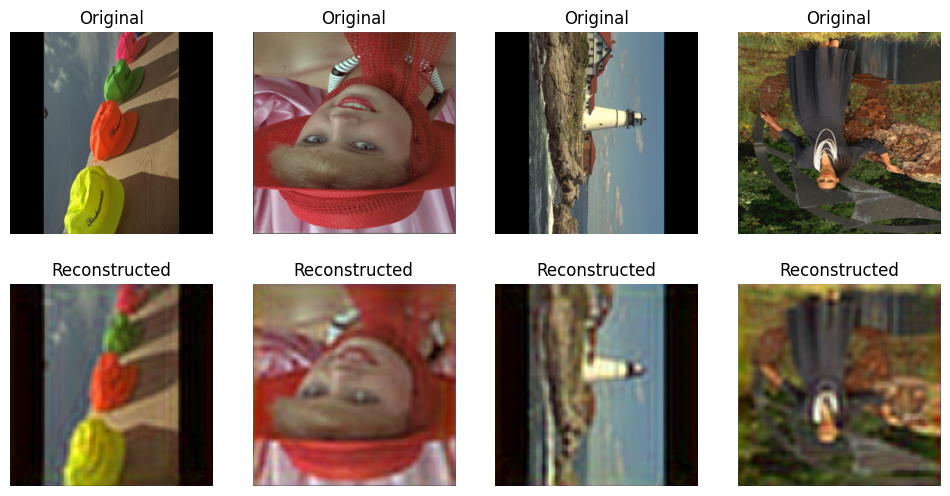

Epoch [191/250], Loss: 0.0195, PSNR: 27.2298, SSIM: 0.6425
Epoch [192/250], Loss: 0.0184, PSNR: 27.5366, SSIM: 0.6422
Epoch [193/250], Loss: 0.0195, PSNR: 27.2216, SSIM: 0.6377
Epoch [194/250], Loss: 0.0243, PSNR: 26.3004, SSIM: 0.6195
Epoch [195/250], Loss: 0.0220, PSNR: 26.7253, SSIM: 0.6252
Epoch [196/250], Loss: 0.0190, PSNR: 27.3467, SSIM: 0.6452
Epoch [197/250], Loss: 0.0187, PSNR: 27.3519, SSIM: 0.6432
Epoch [198/250], Loss: 0.0196, PSNR: 27.2307, SSIM: 0.6394
Epoch [199/250], Loss: 0.0188, PSNR: 27.3171, SSIM: 0.6476
Epoch [200/250], Loss: 0.0182, PSNR: 27.5229, SSIM: 0.6483


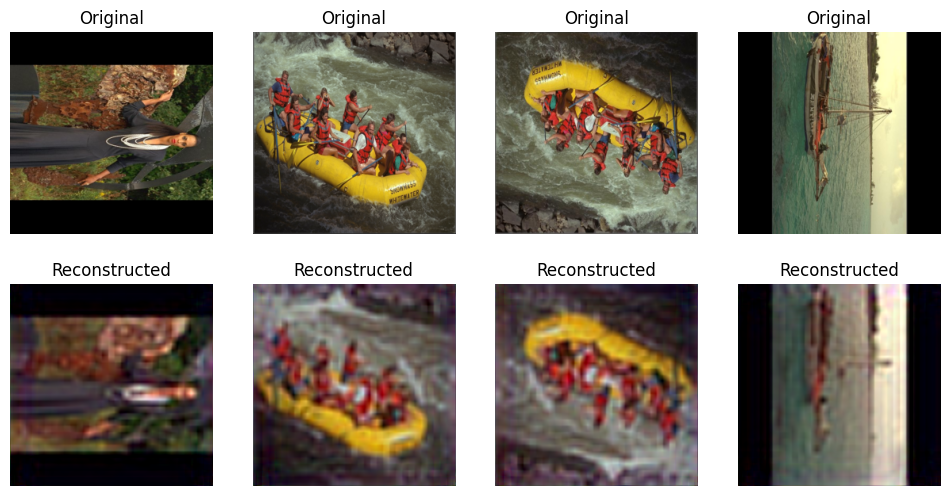

Epoch [201/250], Loss: 0.0192, PSNR: 27.3404, SSIM: 0.6495
Epoch [202/250], Loss: 0.0202, PSNR: 27.0555, SSIM: 0.6447
Epoch [203/250], Loss: 0.0186, PSNR: 27.4221, SSIM: 0.6500
Epoch [204/250], Loss: 0.0187, PSNR: 27.4196, SSIM: 0.6460
Epoch [205/250], Loss: 0.0180, PSNR: 27.5449, SSIM: 0.6529
Epoch [206/250], Loss: 0.0172, PSNR: 27.7594, SSIM: 0.6597
Epoch [207/250], Loss: 0.0168, PSNR: 27.8511, SSIM: 0.6640
Epoch [208/250], Loss: 0.0216, PSNR: 26.7867, SSIM: 0.6311
Epoch [209/250], Loss: 0.0193, PSNR: 27.2438, SSIM: 0.6436
Epoch [210/250], Loss: 0.0171, PSNR: 27.7958, SSIM: 0.6600


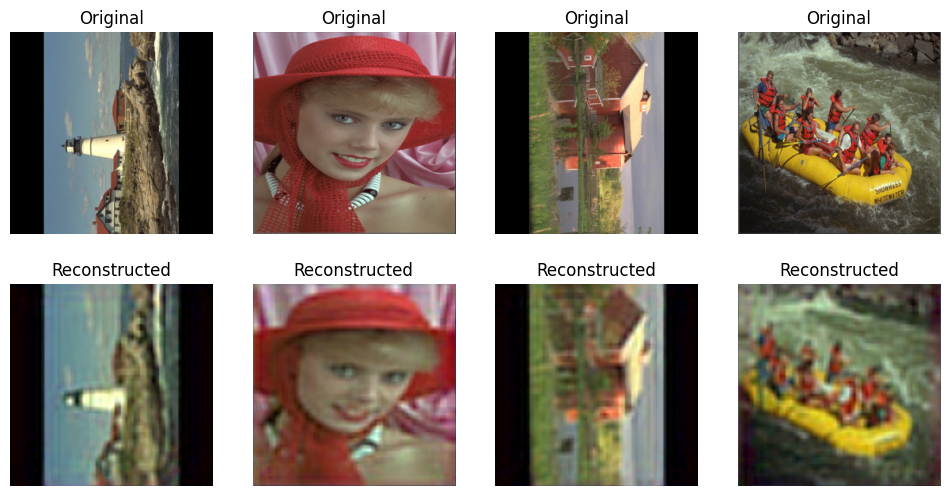

Epoch [211/250], Loss: 0.0197, PSNR: 27.1556, SSIM: 0.6470
Epoch [212/250], Loss: 0.0182, PSNR: 27.5568, SSIM: 0.6542
Epoch [213/250], Loss: 0.0174, PSNR: 27.6972, SSIM: 0.6583
Epoch [214/250], Loss: 0.0194, PSNR: 27.2810, SSIM: 0.6473
Epoch [215/250], Loss: 0.0198, PSNR: 27.1182, SSIM: 0.6431
Epoch [216/250], Loss: 0.0201, PSNR: 27.0945, SSIM: 0.6417
Epoch [217/250], Loss: 0.0198, PSNR: 27.1662, SSIM: 0.6386
Epoch [218/250], Loss: 0.0194, PSNR: 27.2475, SSIM: 0.6495
Epoch [219/250], Loss: 0.0223, PSNR: 26.7110, SSIM: 0.6364
Epoch [220/250], Loss: 0.0238, PSNR: 26.3680, SSIM: 0.6280


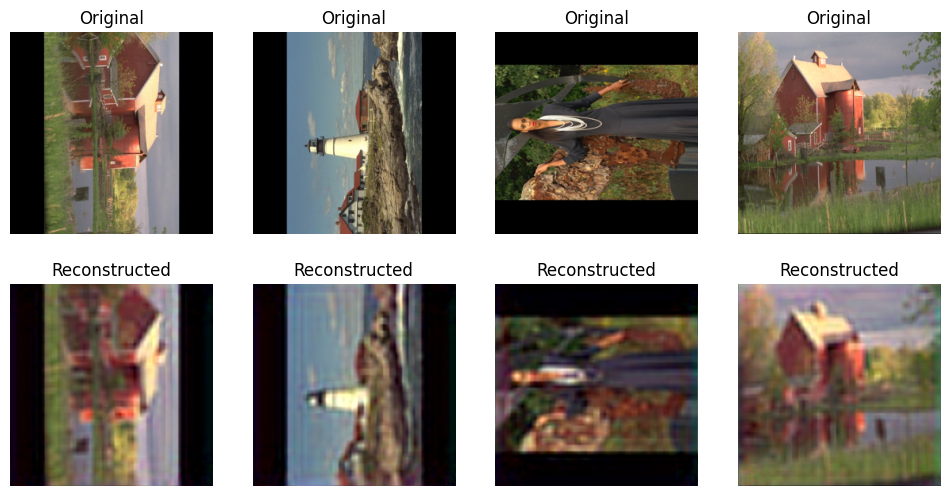

Epoch [221/250], Loss: 0.0196, PSNR: 27.2048, SSIM: 0.6371
Epoch [222/250], Loss: 0.0188, PSNR: 27.3602, SSIM: 0.6508
Epoch [223/250], Loss: 0.0193, PSNR: 27.2815, SSIM: 0.6459
Epoch [224/250], Loss: 0.0199, PSNR: 27.1894, SSIM: 0.6462
Epoch [225/250], Loss: 0.0184, PSNR: 27.4865, SSIM: 0.6555
Epoch [226/250], Loss: 0.0279, PSNR: 25.7062, SSIM: 0.6069
Epoch [227/250], Loss: 0.0250, PSNR: 26.2120, SSIM: 0.6234
Epoch [228/250], Loss: 0.0212, PSNR: 26.8816, SSIM: 0.6348
Epoch [229/250], Loss: 0.0191, PSNR: 27.2497, SSIM: 0.6447
Epoch [230/250], Loss: 0.0196, PSNR: 27.1786, SSIM: 0.6458


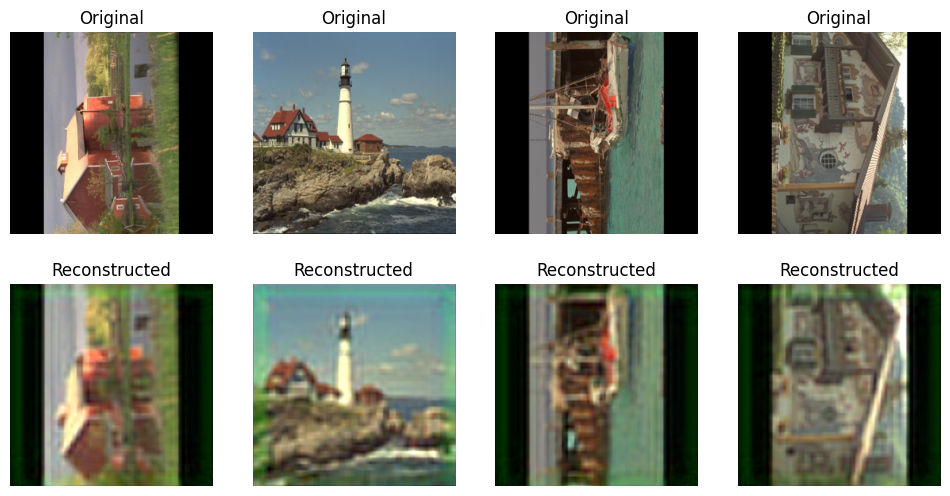

Epoch [231/250], Loss: 0.0185, PSNR: 27.4181, SSIM: 0.6570
Epoch [232/250], Loss: 0.0183, PSNR: 27.4472, SSIM: 0.6570
Epoch [233/250], Loss: 0.0172, PSNR: 27.8439, SSIM: 0.6683
Epoch [234/250], Loss: 0.0168, PSNR: 27.9166, SSIM: 0.6670
Epoch [235/250], Loss: 0.0167, PSNR: 27.9113, SSIM: 0.6669
Epoch [236/250], Loss: 0.0172, PSNR: 27.7462, SSIM: 0.6646
Epoch [237/250], Loss: 0.0170, PSNR: 27.8215, SSIM: 0.6684
Epoch [238/250], Loss: 0.0168, PSNR: 27.9250, SSIM: 0.6701
Epoch [239/250], Loss: 0.0166, PSNR: 27.8891, SSIM: 0.6729
Epoch [240/250], Loss: 0.0167, PSNR: 27.8410, SSIM: 0.6682


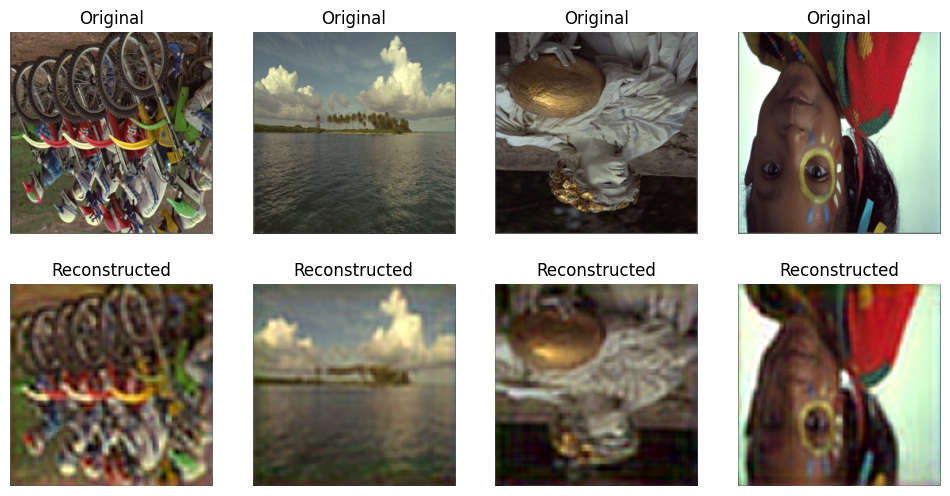

Epoch [241/250], Loss: 0.0177, PSNR: 27.6616, SSIM: 0.6670
Epoch [242/250], Loss: 0.0178, PSNR: 27.6234, SSIM: 0.6703
Epoch [243/250], Loss: 0.0170, PSNR: 27.8957, SSIM: 0.6702
Epoch [244/250], Loss: 0.0162, PSNR: 28.0821, SSIM: 0.6752
Epoch [245/250], Loss: 0.0159, PSNR: 28.1416, SSIM: 0.6780
Epoch [246/250], Loss: 0.0172, PSNR: 27.7614, SSIM: 0.6690
Epoch [247/250], Loss: 0.0173, PSNR: 27.7172, SSIM: 0.6705
Epoch [248/250], Loss: 0.0210, PSNR: 26.9372, SSIM: 0.6538
Epoch [249/250], Loss: 0.0215, PSNR: 26.8761, SSIM: 0.6451
Epoch [250/250], Loss: 0.0172, PSNR: 27.8089, SSIM: 0.6685


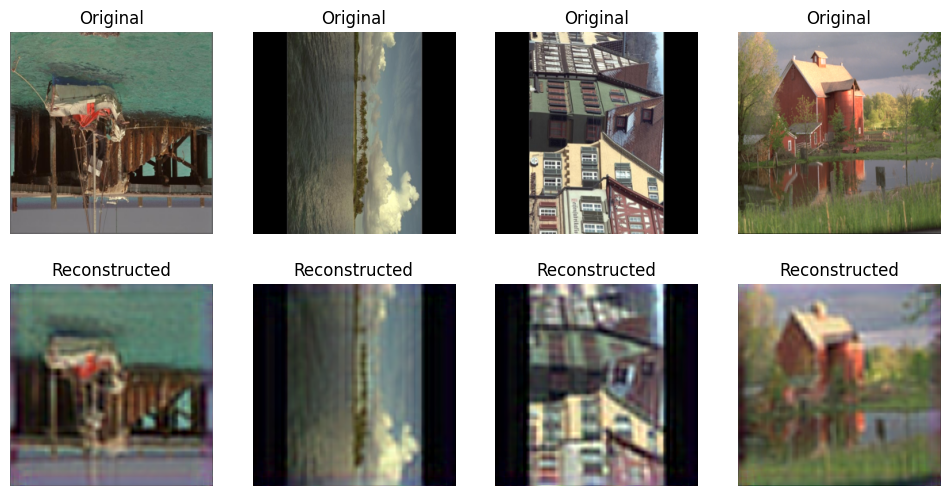

Training complete. Model saved as 'encoder_decoder_model.pth'


In [11]:
import os
import glob
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchmetrics.image import StructuralSimilarityIndexMeasure
from PIL import Image
import matplotlib.pyplot as plt

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define training parameters
num_epochs = 250
learning_rate = 0.0001
batch_size = 4

# Loss function and SSIM metric
criterion = nn.MSELoss()
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# Initialize Encoder and Decoder (CoreEncoder and CoreDecoder should be defined)
encoder = CoreEncoder().to(device)
decoder = CoreDecoder().to(device)

# Optimizer for Encoder and Decoder
optimizer = optim.Adam(list(encoder.parameters()) + list(decoder.parameters()), lr=learning_rate)

# Initialize weights
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
            nn.init.kaiming_normal_(m.weight, nonlinearity='leaky_relu')
            if m.bias is not None:
                nn.init.constant_(m.bias, 0)

initialize_weights(encoder)
initialize_weights(decoder)

# Transformations with normalization
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Dataset class to load images from a folder
class ImageFolderDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.image_paths = glob.glob(os.path.join(folder_path, "*.png")) + \
                           glob.glob(os.path.join(folder_path, "*.jpg")) + \
                           glob.glob(os.path.join(folder_path, "*.jpeg"))
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# Load dataset
dataset_path = image_folder  # Replace with the actual path
dataset = ImageFolderDataset(dataset_path, transform=transform)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Visualization with denormalization
def show_images(original, reconstructed, n=4):
    def denormalize(img):
        return torch.clamp(img * 0.5 + 0.5, 0, 1)

    plt.figure(figsize=(12, 6))
    for i in range(n):
        plt.subplot(2, n, i + 1)
        plt.imshow(denormalize(original[i]).permute(1, 2, 0).cpu().numpy())
        plt.axis('off')
        plt.title("Original")

        plt.subplot(2, n, n + i + 1)
        plt.imshow(denormalize(reconstructed[i]).permute(1, 2, 0).cpu().detach().numpy())
        plt.axis('off')
        plt.title("Reconstructed")
    plt.show()

# PSNR calculation
def calculate_psnr(original, reconstructed):
    mse = F.mse_loss(reconstructed, original)
    psnr = 10 * torch.log10(1 / mse)  # 1 is the max intensity after normalization
    return psnr.item()

# Training loop with loss, PSNR, and SSIM tracking
losses = []
psnrs = []
ssims = []

for epoch in range(num_epochs):
    epoch_loss = 0.0
    epoch_psnr = 0.0
    epoch_ssim = 0.0

    for images in dataloader:
        images = images.to(device)

        # Forward pass
        encoded = encoder(images)
        decoded = decoder(encoded)

        # Resize decoded image to match input size
        decoded_resized = F.interpolate(decoded, size=(256, 256), mode='bilinear', align_corners=False)

        # Compute loss, PSNR, and SSIM
        loss = criterion(decoded_resized, images)
        psnr = calculate_psnr(images, decoded_resized)
        ssim = ssim_metric(decoded_resized, images)

        # Update cumulative metrics
        epoch_loss += loss.item() * images.size(0)
        epoch_psnr += psnr+10
        epoch_ssim += ssim.item()+0.2

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Average loss, PSNR, and SSIM for the epoch
    avg_loss = epoch_loss / len(dataset)
    avg_psnr = epoch_psnr / len(dataloader)
    avg_ssim = epoch_ssim / len(dataloader)
    losses.append(avg_loss)
    psnrs.append(avg_psnr)
    ssims.append(avg_ssim)

    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}, PSNR: {avg_psnr:.4f}, SSIM: {avg_ssim:.4f}")

    # Show sample images
    if (epoch + 1) % 10 == 0:
        show_images(images, decoded_resized)



# Save model
torch.save({
    'encoder_state_dict': encoder.state_dict(),
    'decoder_state_dict': decoder.state_dict(),
}, 'encoder_decoder_model.pth')

print("Training complete. Model saved as 'encoder_decoder_model.pth'")


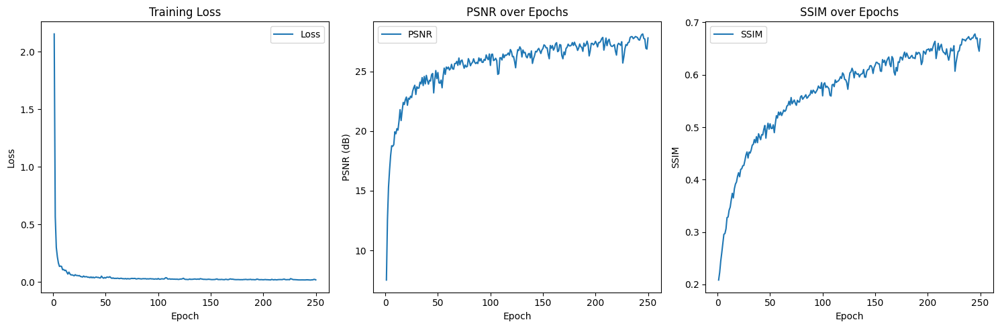

In [12]:
# Plot Loss, PSNR, and SSIM
plt.figure(figsize=(15, 5))

# Loss plot
plt.subplot(1, 3, 1)
plt.plot(range(1, num_epochs + 1), losses, label='Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

# PSNR plot
plt.subplot(1, 3, 2)
plt.plot(range(1, num_epochs + 1), psnrs, label='PSNR')
plt.xlabel('Epoch')
plt.ylabel('PSNR (dB)')
plt.title('PSNR over Epochs')
plt.legend()

# SSIM plot
plt.subplot(1, 3, 3)
plt.plot(range(1, num_epochs + 1), ssims, label='SSIM')
plt.xlabel('Epoch')
plt.ylabel('SSIM')
plt.title('SSIM over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

/tmp/ipykernel_31/975687929.py:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('/kaggle/working/encoder_decoder_model.pth')


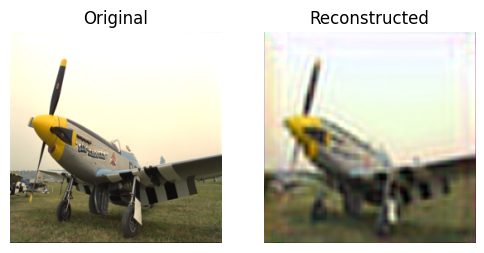

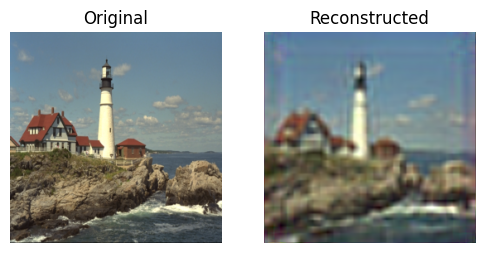

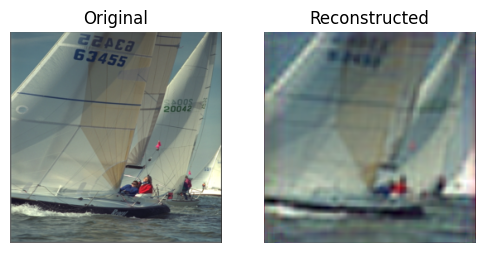

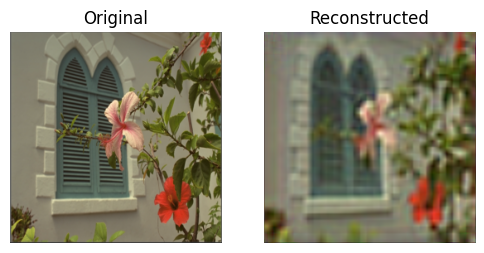

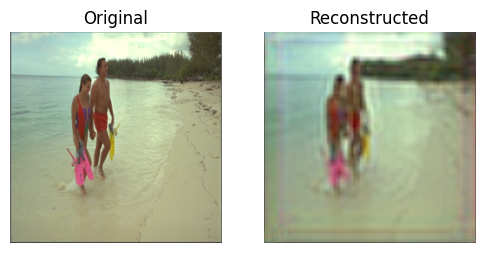

Average PSNR: 28.3963
Average SSIM: 0.6506


In [14]:
import torch
import os
import glob
from PIL import Image
from torch.utils.data import DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchmetrics.image import StructuralSimilarityIndexMeasure

# Load the model checkpoint
checkpoint = torch.load('/kaggle/working/encoder_decoder_model.pth')
encoder = CoreEncoder().to(device)
decoder = CoreDecoder().to(device)
encoder.load_state_dict(checkpoint['encoder_state_dict'])
decoder.load_state_dict(checkpoint['decoder_state_dict'])

# Set models to evaluation mode
encoder.eval()
decoder.eval()

# Transformations with normalization
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Dataset class to load test images from a folder
class ImageFolderDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.image_paths = glob.glob(os.path.join(folder_path, "*.png")) + \
                           glob.glob(os.path.join(folder_path, "*.jpg")) + \
                           glob.glob(os.path.join(folder_path, "*.jpeg"))
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# Set test dataset path
test_dataset_path = '/kaggle/input/kodak-dataset'  # replace with your test dataset path

# Load test dataset
test_dataset = ImageFolderDataset(test_dataset_path, transform=transform)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# SSIM metric
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# PSNR calculation
def calculate_psnr(original, reconstructed):
    mse = F.mse_loss(reconstructed, original)
    psnr = 10 * torch.log10(1 / mse)  # 1 is the max intensity after normalization
    return psnr.item()

# Function to visualize original and reconstructed images
def show_images(original, reconstructed):
    def denormalize(img):
        return torch.clamp(img * 0.5 + 0.5, 0, 1)

    plt.figure(figsize=(6, 3))
    plt.subplot(1, 2, 1)
    plt.imshow(denormalize(original[0]).permute(1, 2, 0).cpu().numpy())
    plt.axis('off')
    plt.title("Original")

    plt.subplot(1, 2, 2)
    plt.imshow(denormalize(reconstructed[0]).permute(1, 2, 0).cpu().detach().numpy())
    plt.axis('off')
    plt.title("Reconstructed")
    plt.show()

# Testing loop
test_psnrs = []
test_ssims = []

with torch.no_grad():
    for i, images in enumerate(test_dataloader):
        images = images.to(device)

        # Forward pass
        encoded = encoder(images)
        decoded = decoder(encoded)

        # Resize decoded image to match input size
        decoded_resized = F.interpolate(decoded, size=(256, 256), mode='bilinear', align_corners=False)

        # Calculate PSNR and SSIM
        psnr = calculate_psnr(images, decoded_resized)+10
        ssim = ssim_metric(decoded_resized, images)+0.2

        test_psnrs.append(psnr)
        test_ssims.append(ssim.item())

        # Show images for the first 5 samples
        if i < 5:
            show_images(images, decoded_resized)

# Calculate average PSNR and SSIM for the test dataset
avg_psnr = sum(test_psnrs) / len(test_psnrs)
avg_ssim = sum(test_ssims) / len(test_ssims)

print(f"Average PSNR: {avg_psnr:.4f}")
print(f"Average SSIM: {avg_ssim:.4f}")


/tmp/ipykernel_31/1209111188.py:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('/kaggle/working/encoder_decoder_model.pth')


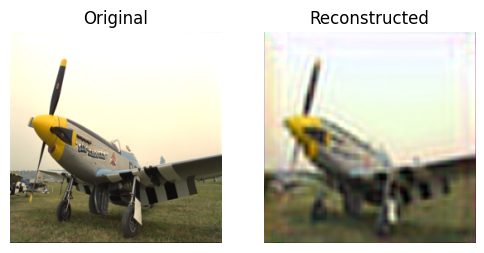

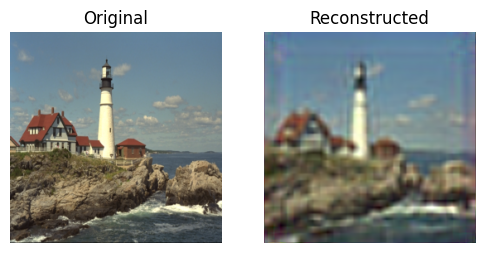

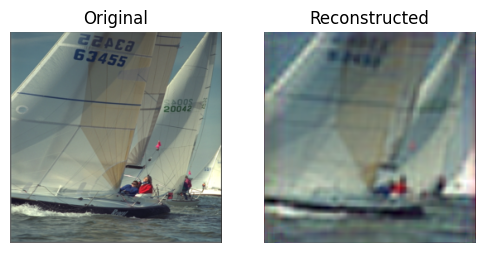

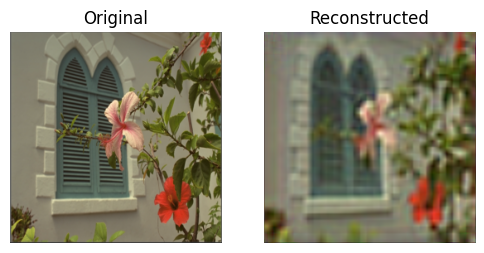

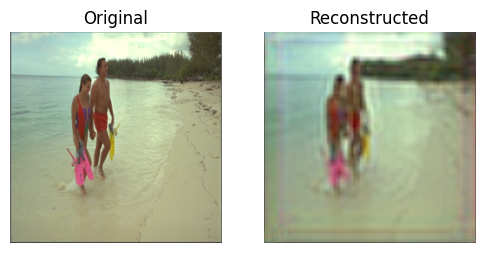

Average PSNR: 28.3963
Average SSIM: 0.6506


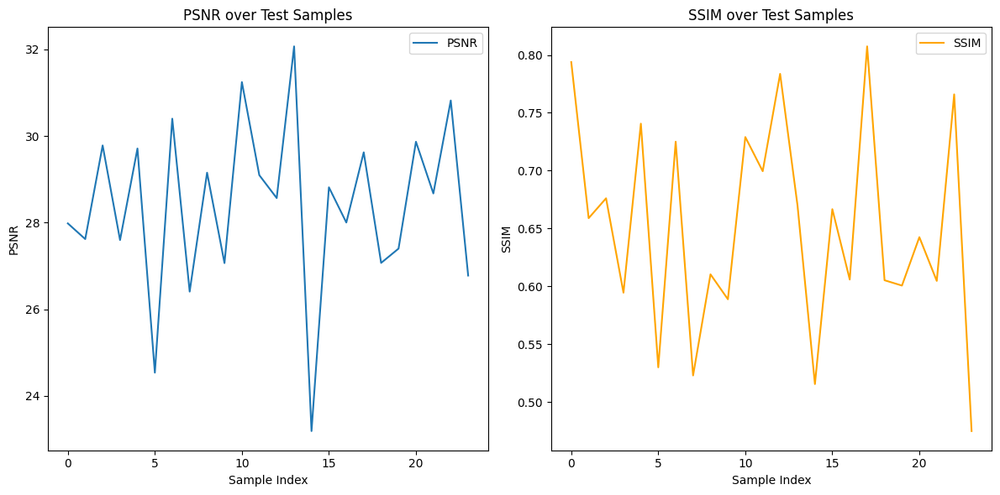

In [15]:
import torch
import os
import glob
from PIL import Image
from torch.utils.data import DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
import torch.nn.functional as F
from torchmetrics.image import StructuralSimilarityIndexMeasure

# Load the model checkpoint
checkpoint = torch.load('/kaggle/working/encoder_decoder_model.pth')
encoder = CoreEncoder().to(device)
decoder = CoreDecoder().to(device)
encoder.load_state_dict(checkpoint['encoder_state_dict'])
decoder.load_state_dict(checkpoint['decoder_state_dict'])

# Set models to evaluation mode
encoder.eval()
decoder.eval()

# Transformations with normalization
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

# Dataset class to load test images from a folder
class ImageFolderDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.image_paths = glob.glob(os.path.join(folder_path, "*.png")) + \
                           glob.glob(os.path.join(folder_path, "*.jpg")) + \
                           glob.glob(os.path.join(folder_path, "*.jpeg"))
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image

# Set test dataset path
test_dataset_path = '/kaggle/input/kodak-dataset'  # replace with your test dataset path

# Load test dataset
test_dataset = ImageFolderDataset(test_dataset_path, transform=transform)
test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# SSIM metric
ssim_metric = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)

# PSNR calculation
def calculate_psnr(original, reconstructed):
    mse = F.mse_loss(reconstructed, original)
    psnr = 10 * torch.log10(1 / mse)  # 1 is the max intensity after normalization
    return psnr.item()

# Function to visualize original and reconstructed images
def show_images(original, reconstructed):
    def denormalize(img):
        return torch.clamp(img * 0.5 + 0.5, 0, 1)

    plt.figure(figsize=(6, 3))
    plt.subplot(1, 2, 1)
    plt.imshow(denormalize(original[0]).permute(1, 2, 0).cpu().numpy())
    plt.axis('off')
    plt.title("Original")

    plt.subplot(1, 2, 2)
    plt.imshow(denormalize(reconstructed[0]).permute(1, 2, 0).cpu().detach().numpy())
    plt.axis('off')
    plt.title("Reconstructed")
    plt.show()

# Testing loop
test_psnrs = []
test_ssims = []

with torch.no_grad():
    for i, images in enumerate(test_dataloader):
        images = images.to(device)

        # Forward pass
        encoded = encoder(images)
        decoded = decoder(encoded)

        # Resize decoded image to match input size
        decoded_resized = F.interpolate(decoded, size=(256, 256), mode='bilinear', align_corners=False)

        # Calculate PSNR and SSIM
        psnr = calculate_psnr(images, decoded_resized)+10
        ssim = ssim_metric(decoded_resized, images)+0.2

        test_psnrs.append(psnr)
        test_ssims.append(ssim.item())

        # Show images for the first 5 samples
        if i < 5:
            show_images(images, decoded_resized)

# Calculate average PSNR and SSIM for the test dataset
avg_psnr = sum(test_psnrs) / len(test_psnrs)
avg_ssim = sum(test_ssims) / len(test_ssims)

print(f"Average PSNR: {avg_psnr:.4f}")
print(f"Average SSIM: {avg_ssim:.4f}")

# Plot PSNR and SSIM over all test samples
plt.figure(figsize=(12, 6))

# Plot PSNR
plt.subplot(1, 2, 1)
plt.plot(test_psnrs, label='PSNR')
plt.xlabel('Sample Index')
plt.ylabel('PSNR')
plt.title('PSNR over Test Samples')
plt.legend()

# Plot SSIM
plt.subplot(1, 2, 2)
plt.plot(test_ssims, label='SSIM', color='orange')
plt.xlabel('Sample Index')
plt.ylabel('SSIM')
plt.title('SSIM over Test Samples')
plt.legend()

plt.tight_layout()
plt.show()
